In [1]:
import numpy as np 
import glob
from myvtk.GetMakeVtk import GetMyVtk, makeVtkFile, measure_length
import matplotlib.pyplot as plt
from scipy.stats import zscore
from sklearn.preprocessing import StandardScaler
import seaborn as sns

from PIL import Image, ImageDraw, ImageFont
import cv2

from sklearn.manifold import LocallyLinearEmbedding
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression

from myvtk.srv import square_root_velocity

from sklearn.decomposition import PCA
from scipy.signal import find_peaks
from procrustes import rotational
import pandas as pd
from copy import copy 
from myvtk.General import *
files = glob.glob("./scaling/resamp_attr_ascii/vmtk64a/*.vtk")
#files = glob.glob("./fine_tube/CenterlineExtend_correctindex/extended_centerline/*.vtk")

#########################################
#    vmtkで計算したcurv, torsを使う      #
#       0.5mmまでresamplingした         # 
#########################################
# files = (glob.glob(".\\scaling\\resamp_attr_ascii\\vmtkgeometry\\*.vtk"))


r = []
pts = []
PTN = []
curvs = []
torss = []
abscs = [] 
Tangents = []
fNormals = []
fBinormals = []

abnormal_shape_filename = [
                        "BG0002",
                        "BH0002",
                        "BH0004",
                        "BH0008",
                        "BH0032",
                        ]

normal_files = []
abnormal_idx = []

print (len(files))

for name in abnormal_shape_filename:
    for i in range(len(files)):
        if name in files[i]:
            print (name, files[i])
            abnormal_idx.append(i)
            break   
        else:
            normal_files.append(files[i])
            


normal_files = list(set(normal_files))
print (len(normal_files))

for i in range(len(files)): 
    pt, Curv, Tors, Radius, Abscissas, ptns, ftangent, fnormal, fbinormal = GetMyVtk(files[i], frenet=1)
    # if len(pt) != 64:
    #     print (len(pt), files[i])
    #     continue
    centroid = np.array([np.mean(pt[:,0]),np.mean(pt[:,1]),np.mean(pt[:,2])])
    # pt = pt-centroid
    pts.append(pt)
    r.append(Radius)
    PTN.append(ptns)
    curvs.append(Curv)
    torss.append(Tors)
    abscs.append(Abscissas)
    Tangents.append(ftangent)
    fNormals.append(fnormal)
    fBinormals.append(fbinormal)
    np.save("D:\\!BraVa_src\\src\\Blender\\pt\\{}_{}".format(
        files[i].split("\\")[-1].split("_")[0],
        files[i].split("\\")[-1].split("_")[1]),pt)
    np.save("D:\\!BraVa_src\\src\\Blender\\r\\{}_{}.npy".format(
        files[i].split("\\")[-1].split("_")[0],
        files[i].split("\\")[-1].split("_")[1]),Radius)
    np.save("D:\\!BraVa_src\\src\\Blender\\curv\\{}_{}.npy".format(
        files[i].split("\\")[-1].split("_")[0],
        files[i].split("\\")[-1].split("_")[1]),Curv)
    np.save("D:\\!BraVa_src\\src\\Blender\\tors\\{}_{}.npy".format(
        files[i].split("\\")[-1].split("_")[0],
        files[i].split("\\")[-1].split("_")[1]),Tors)
pts = np.array(pts)
r = np.array(r)
PTN = np.array(PTN)
curvs=np.array(curvs)
torss = np.array(torss)
abscs= np.array(abscs)
Tangents = np.array(Tangents)
fNormals = np.array(fNormals)
fBinormals = np.array(fBinormals)
print (Tangents.shape)
print (PTN.shape)
print (fBinormals.shape)

104
BG0002 ./scaling/resamp_attr_ascii/vmtk64a\BG0002_Left_new_new.vtk
BH0002 ./scaling/resamp_attr_ascii/vmtk64a\BH0002_Left_new_new.vtk
BH0004 ./scaling/resamp_attr_ascii/vmtk64a\BH0004_Left_new_new.vtk
BH0008 ./scaling/resamp_attr_ascii/vmtk64a\BH0008_Left_new_new.vtk
BH0032 ./scaling/resamp_attr_ascii/vmtk64a\BH0032_Left_new_new.vtk
84
(104, 64, 3)
(104, 64, 3)
(104, 64, 3)


In [2]:
feature = np.load('./CUSV/srvr_feature.npy')
print (feature.shape)

l_feature = np.load('./CUSV/landmarkpca.npy')
print (l_feature.shape)


(104, 16)
(104, 16)


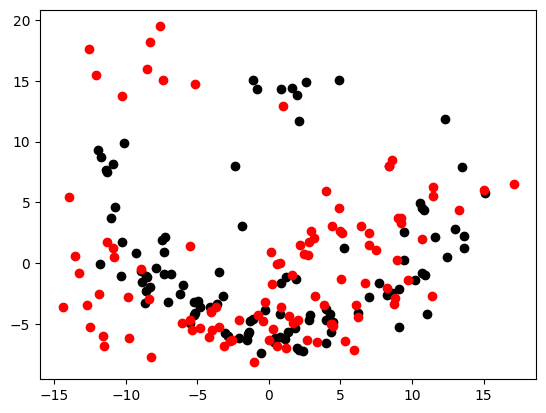

In [3]:
plt.scatter(feature[:,0], feature[:,1],color="k")
plt.scatter(l_feature[:,0], l_feature[:,1],color="r")
#plt.xscale('log')
#plt.yscale('log')

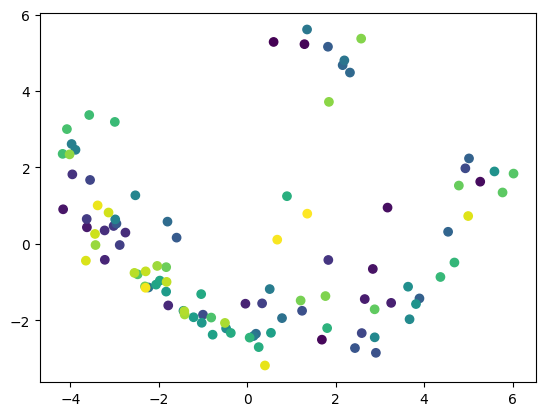

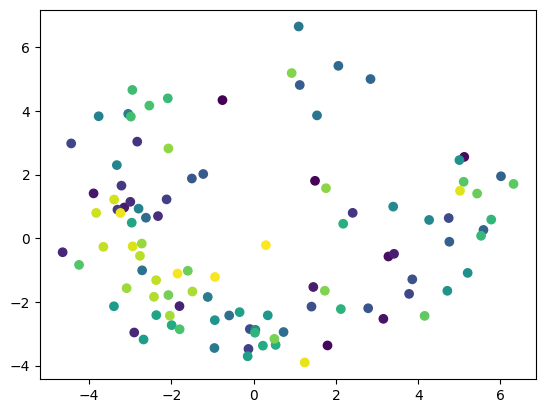

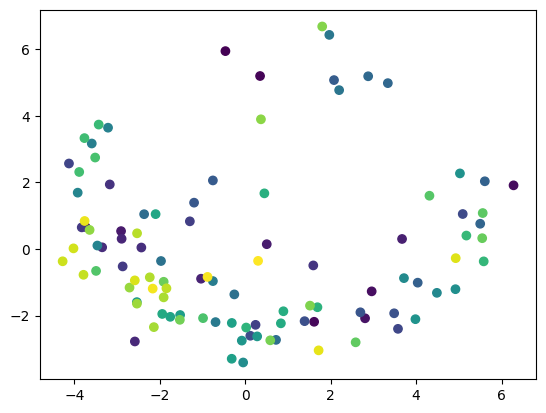

In [4]:
def flatten_3d(pt):
    a = np.concatenate([pt[:,0], pt[:,1],pt[:,2]],axis=0)
    # print ("a shape:", a.shape)
    return a

def flatten_3d_dataset(pts):
    result = []
    for i in range(len(pts)):
        # print (flatten_3d(pts[i]).shape)
        result.append(flatten_3d(pts[i]))
    result = np.array(result)
    # print (result.shape)
    return result

flat_t = flatten_3d_dataset(Tangents)
flat_n = flatten_3d_dataset(fNormals)
flat_b = flatten_3d_dataset(fBinormals)

pca = PCA(n_components=16)
t_result = pca.fit_transform(flat_t)
plt.scatter(t_result[:,0], t_result[:,1],c=range(len(files)))
plt.show()

pca = PCA(n_components=16)
n_result = pca.fit_transform(flat_n)
plt.scatter(n_result[:,0], n_result[:,1],c=range(len(files)))
plt.show()


pca = PCA(n_components=16)
b_result = pca.fit_transform(flat_b)
plt.scatter(b_result[:,0], b_result[:,1],c=range(len(files)))
plt.show()

C:\Users\cheno\AppData\Local\Temp\ipykernel_47380\230067380.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(dpi=140,figsize=(12,5))


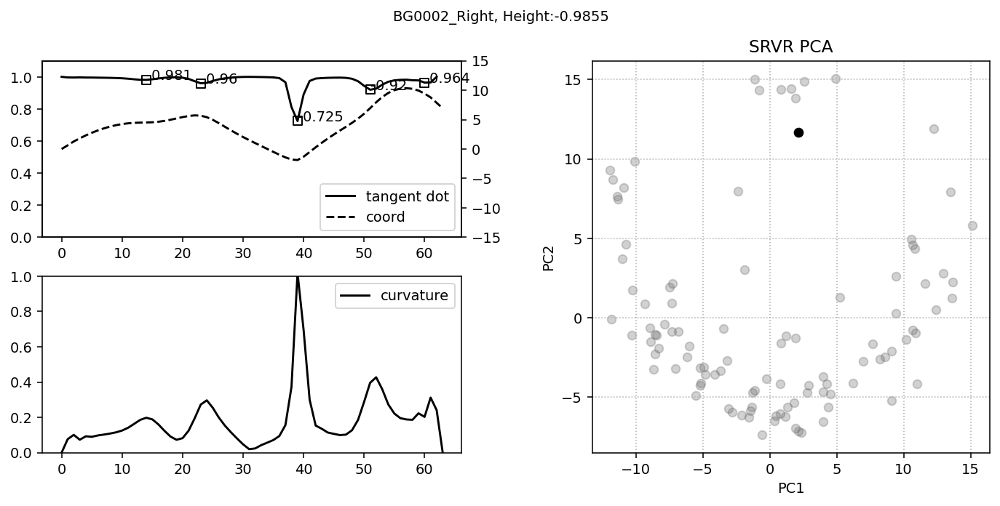

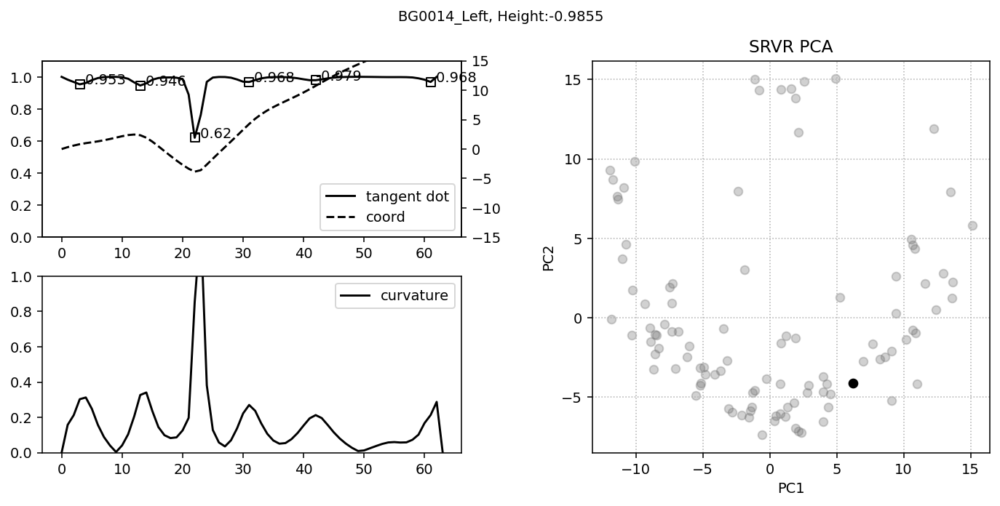

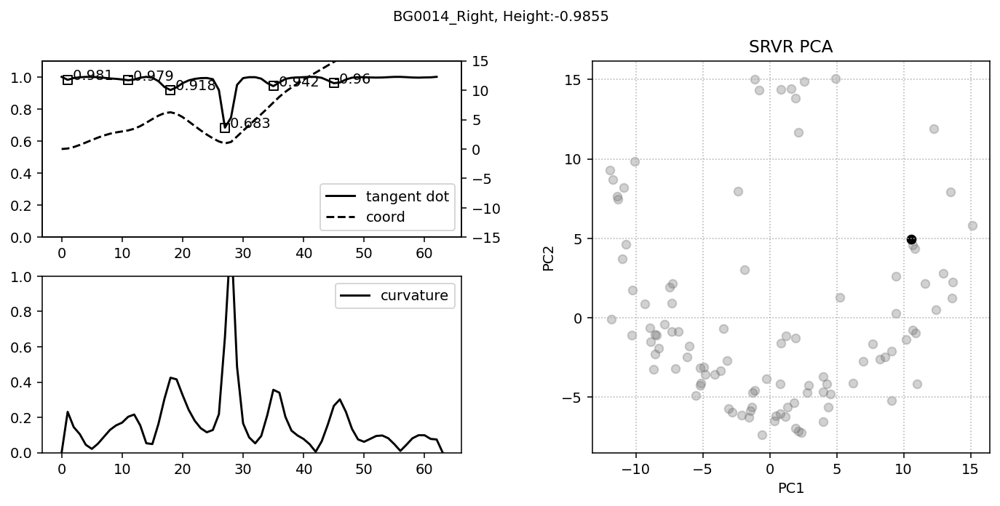

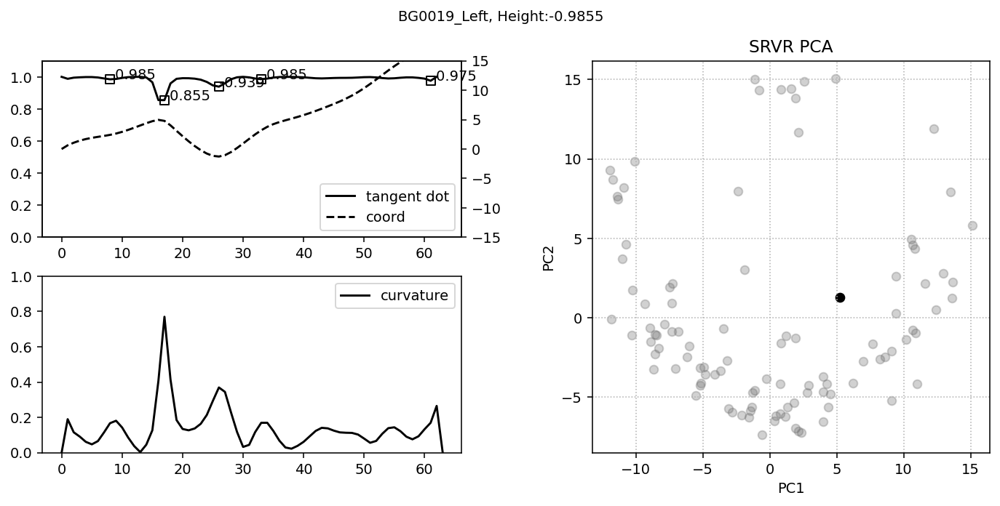

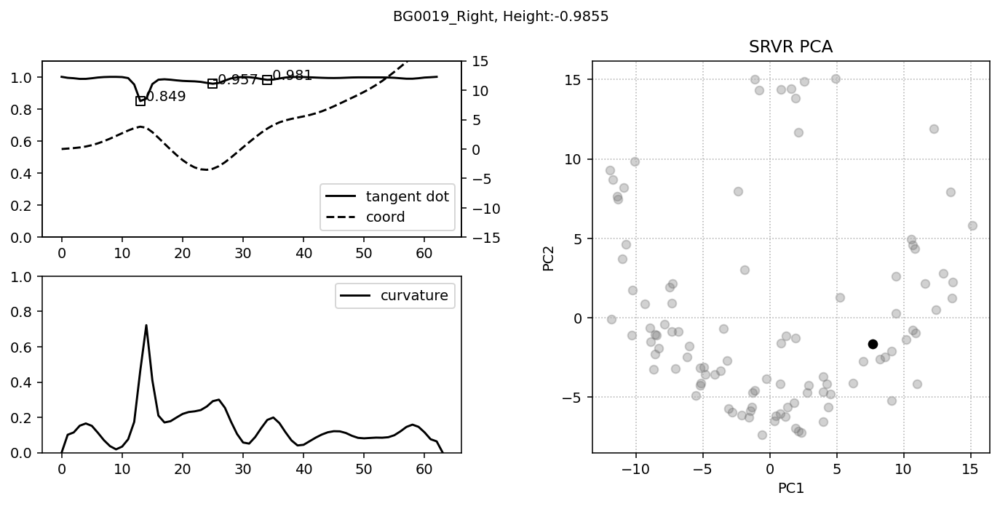

...

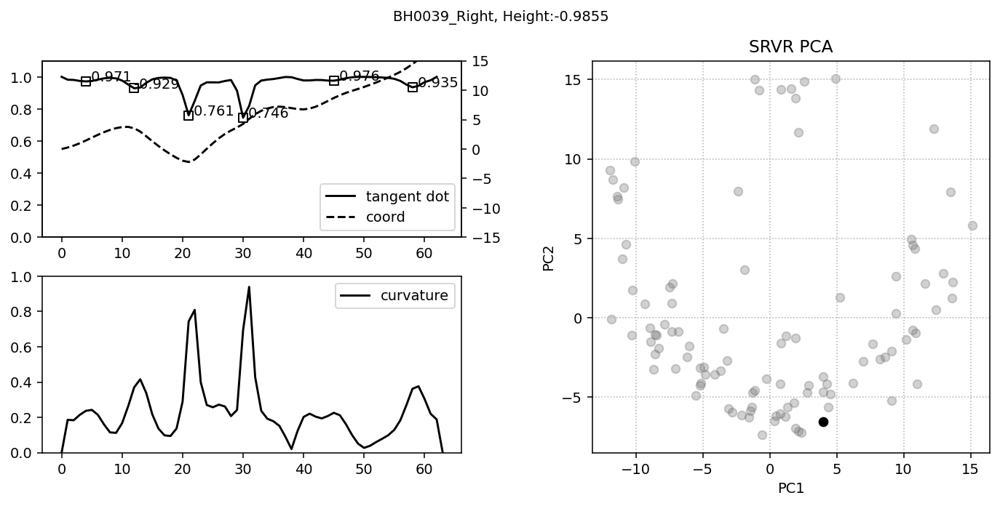

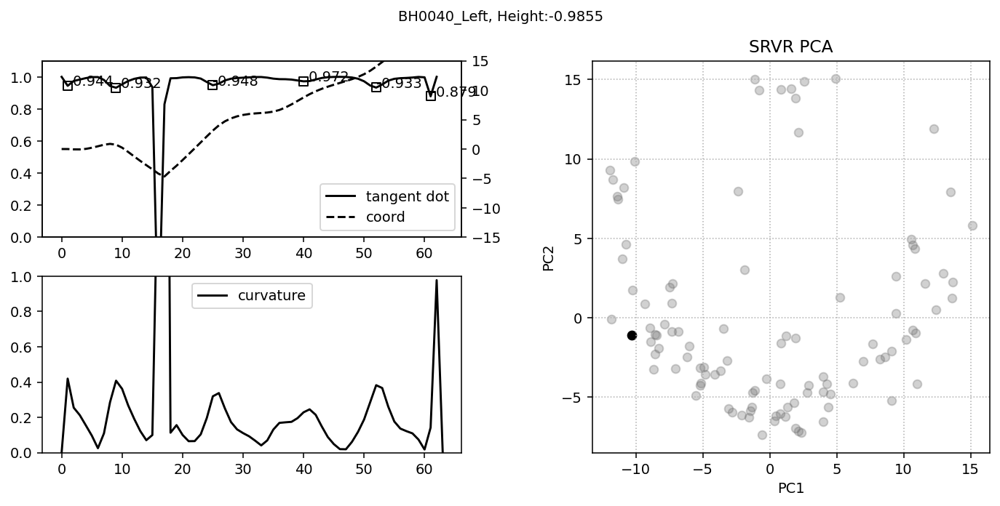

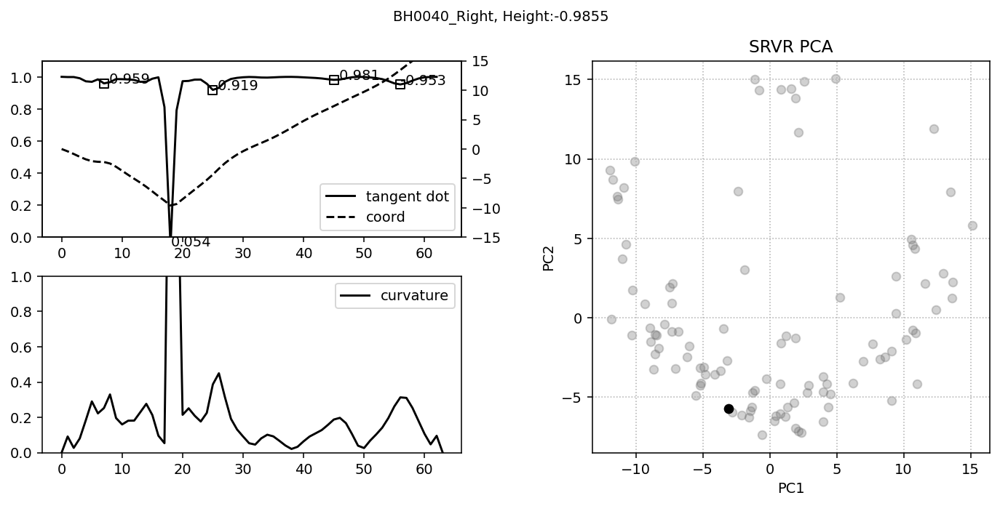

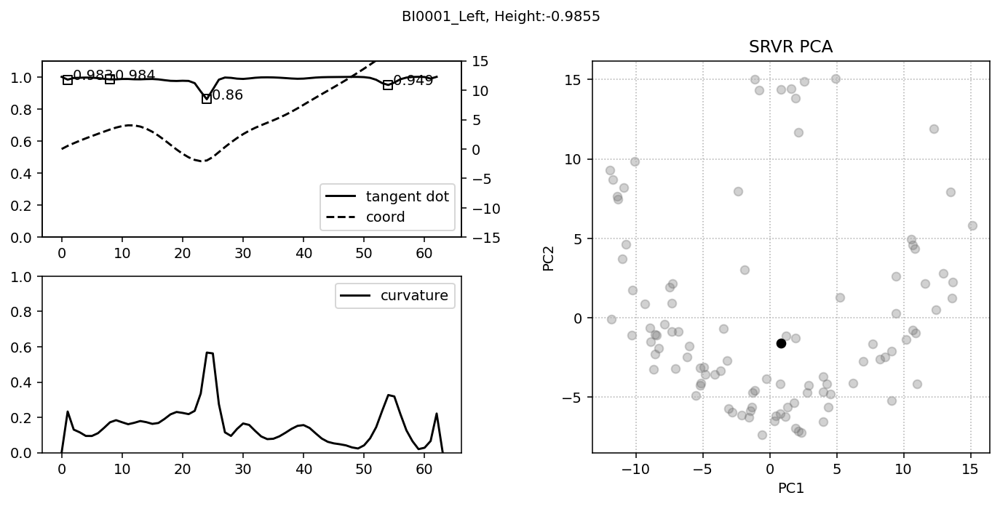

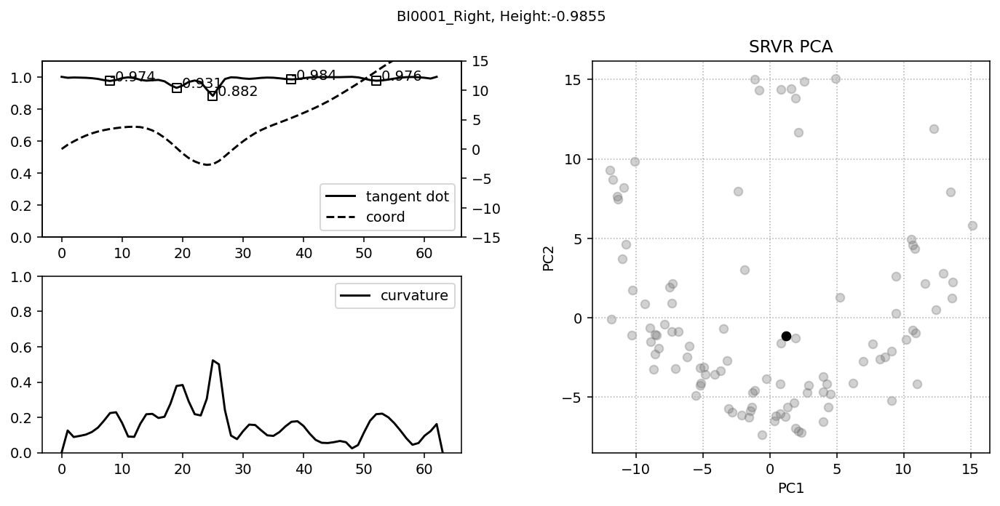

In [5]:
Height = -0.9855
# Threshold = 3
for idx in range(len(files)):
    if idx in abnormal_idx:
        continue
    filename  =  files[idx].split("\\")[-1][:-12]
    # k1k2file = "./k1k2/{}.csv".format(filename)
    # df = pd.read_csv(k1k2file, index_col=False)
    # df.columns = ['idx','x_k1','x_k2','y_k1','y_k2','z_k1', 'z_k2']

    temp_pts = pts[idx]
    temp_ptn = PTN[idx]
    temp_tangent = Tangents[idx]
    temp_curv = curvs[idx]
    d_tangent = []

    for nd_idx in range(1, len(temp_pts)):
        # print (nd_idx)
        d_tangent.append(np.dot(temp_tangent[nd_idx-1],temp_tangent[nd_idx]))
    d_tangent=np.array(d_tangent)
    peaks = find_peaks(-d_tangent, distance=6, width=1, height=Height)[0]

    fig = plt.figure(dpi=140,figsize=(12,5))
    fig.suptitle("{}, Height:{}".format(filename, round(Height,4)), fontsize=10)
    gs = fig.add_gridspec(nrows=22, ncols=45)
    ax = fig.add_subplot(gs[:10, :20])
    ax2 = fig.add_subplot(gs[12:, :20])
    ax3 = fig.add_subplot(gs[:, 26:])
    ax3.scatter(feature[:,0], feature[:,1], color="dimgray", alpha=0.3)
    ax3.scatter(feature[idx,0], feature[idx,1], color="black", alpha=1.)
    ax3.set_xlabel("PC1",fontsize=10)
    ax3.set_ylabel("PC2",fontsize=10)
    ax3.grid(linestyle=":")
    ax3.set_title("SRVR PCA")

    ax1 = ax.twinx()
    ax.set_ylim(0,1.1)
    ax1.set_ylim(-15,15)
    lns1 =ax.plot(d_tangent, label="tangent dot", color="black")
    lns2 =ax1.plot(temp_pts[:,2],linestyle="--",label="coord", color="black")
    for p in peaks:
        ax.scatter(p, d_tangent[p], color="white", edgecolors="black", marker="s")
        ax.text(p, d_tangent[p], -round(d_tangent[p], 3))
    lns = lns1+lns2
    labs = [l.get_label() for l in lns]
    ax.legend(lns, labs, loc=4)
    ax2.plot(temp_curv,label="curvature", color="black")
    ax2.set_ylim(0,1)
    ax2.legend()
    # plt.tight_layout()
    # plt.savefig("./CUSV/{}.png".format(filename))
    # plt.close()

~~显然角度应该利用parallel transport frame 的相对转角求绝对转角~~

In [6]:
c_shapes = mkdir("./CUSV/binormal/", 'c_shape')
other_shapes = mkdir("./CUSV/binormal/", 'other_shape')
p_binormal_dir = mkdir('./scaling/resamp_attr_ascii/vmtk64a/', 'Parallel_binormal')

Height = -0.9855
Threshold = 0.00015
padding = 5


idx_buff = []
bool_peaks = []

f = open("./CUSV/angles.csv","w+")
attributes = ['case', 
              'anterior', 'center', 'posterior', 
              'siphon_length','peak_loc',
              'theta', 
              'alpha', 
              'is_V', 'is_C' ,'is_S']

for a in attributes:
    f.write("{},".format(a))
f.write("\n")


for idx in range(len(files)):
    bends = np.zeros(64)
    f_bends = np.zeros(64)
    p_bends = np.zeros(64)
    bool_peak = np.zeros(64)
    filename  =  files[idx].split("\\")[-1][:-12]
    temp_pts = pts[idx]
    temp_ptn = PTN[idx]
    temp_tangent = Tangents[idx]
    temp_binormal = fBinormals[idx]
    temp_fnormal = fNormals[idx]
    temp_pnormal =  np.cross(temp_tangent, temp_ptn)
    temp_curv = curvs[idx]
    d_tangent = []
    for nd_idx in range(1, len(temp_pts)):
        # print (nd_idx)
        d_tangent.append(np.dot(temp_tangent[nd_idx-1],temp_tangent[nd_idx]))
    d_tangent=np.array(d_tangent)
    min_dot_idx = np.argmin(d_tangent)
    # print ("min_dot_idx:", min_dot_idx, filename)
    peaks = find_peaks(-d_tangent, distance=5, width=1, height=Height)[0]
    if len(peaks) > 2:
        max_tangent_theta = np.argmin(d_tangent)
        if np.where(peaks == max_tangent_theta)[0][0] != 0 and np.where(peaks == max_tangent_theta)[0][0] != len(peaks)-1:
            previous_p = peaks[np.where(peaks == max_tangent_theta)[0][0]-1]
            next_p =  peaks[np.where(peaks == max_tangent_theta)[0][0]+1]
            # print (filename,"的MCA转角在：",previous_p, "ICA siphon在：", max_tangent_theta, "siphon结束后的转角在：", next_p)
            siphon2post_length = (next_p-max_tangent_theta)//3
            if next_p+siphon2post_length<64:
                post_padding = siphon2post_length
            else:
                post_padding = 2
            V_angle_1 = np.degrees(np.arccos(np.dot(temp_tangent[next_p-siphon2post_length],
                                                    temp_tangent[next_p+post_padding])))
            C_angle_1 = np.degrees(np.arccos(
                                        np.dot(temp_binormal[max_tangent_theta],
                                               temp_binormal[next_p])))
                
            f.write("{},{},{},{},{},{},{},{},{},{},{}\n".format(filename,
                                            previous_p, 
                                            max_tangent_theta,
                                            next_p,
                                            measure_length(temp_pts[previous_p:next_p]),
                                            max_tangent_theta/len(temp_pts),
                                            V_angle_1, 
                                            C_angle_1,  
                                            int(V_angle_1<60),  
                                            int(C_angle_1>70 and C_angle_1<110),    
                                            int(len(peaks)>6 and C_angle_1<70)
                                            ))
            
        else:
            # print ("夹角最大值出现在第一个或最后一个转角的case：", filename)
            f.write("{},{},{},{},{},{},{},{},{},{},{}\n".format(filename,
                                                                -1,
                                                                -1,
                                                                -1,
                                                                -1,
                                                                -1,
                                                                -1,
                                                                -1,
                                                                -1,
                                                                -1,
                                                                -1))
        # print (filename, peaks, max_tangent_theta,np.where(peaks == max_tangent_theta)[0][0])


    else:
        # print("夹角数小于两个的case：",filename)
        f.write("{},{},{},{},{},{},{},{},{},{},{}\n".format(filename,
                                                                -1,
                                                                -1,
                                                                -1,
                                                                -1,
                                                                -1,
                                                                -1,
                                                                -1,
                                                                -1,
                                                                -1,
                                                                -1))


    # makeVtkFile(savePath=savepath+"{}.vtk".format(filename), coords = temp_pts, scalarAttributes=scalarAttributes, fieldAttributes=[])
f.close()

generating in directory ./CUSV/binormal/c_shape\...
generating in directory ./CUSV/binormal/other_shape\...
generating in directory ./scaling/resamp_attr_ascii/vmtk64a/Parallel_binormal\...


In [10]:
import pandas as pd


df = pd.read_csv("./CUSV/angles.csv")
print (df.columns)

a = df.iloc[:,1:-4].to_numpy()
print (a.shape)
print (a[0])
S_count = 0
C_count = 0
U_count = 0
V_count = 0
for i in range(len(df)):
    if df.iloc[i]["is_S"] == 1:
        S_count+=1
    elif df.iloc[i]["is_C"] ==1:
        #print (df.iloc[i]["case"])
        C_count+=1
    elif df.iloc[i]["is_V"] ==1:
        V_count+=1
    elif df.iloc[i]["is_V"] ==-1:
        print ("!!")
    else:
        U_count+=1

print (C_count, U_count, S_count, V_count)


Index(['case', 'anterior', 'center', 'posterior', 'siphon_length', 'peak_loc',
       'theta', 'alpha', 'is_V', 'is_C', 'is_S', 'Unnamed: 11'],
      dtype='object')
(104, 7)
[ 18.          27.          35.          16.1985038    0.421875
  57.95505146 161.04793234]
!!
!!
!!
!!
!!
16 55 2 26


(104, 16) (104, 7)
(23, 104)
(23, 104)


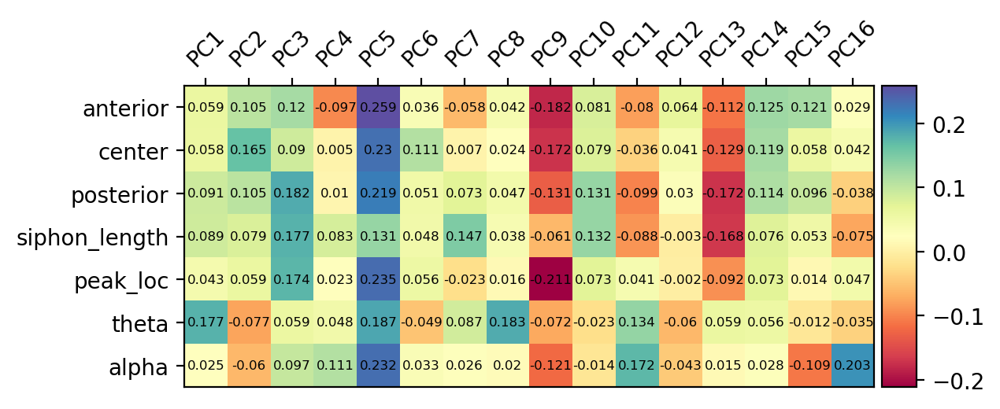

In [15]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

print (feature.shape, a.shape)
mat = np.concatenate([feature, a],axis=1).T
print (mat.shape)

fig = plt.figure(dpi=200)
ax=fig.add_subplot(111)

print (mat.shape)
# plt.imshow(mat[16:,:])
pc_corr = np.corrcoef(mat)
im = ax.imshow(pc_corr[16:,:16],cmap="Spectral")
for i in range(pc_corr[16:,:16].shape[0]):
  for j in range(pc_corr[16:,:16].shape[1]):
    plt.text(j,i,round(pc_corr[16:,:16][i][j],3),
             ha="center", va="center", color="#030303",
             fontsize=6)


PCs=[]
for i in range(1,17):
    PCs.append("PC{}".format(i))
types_str = df.columns[1:-4]
plt.xticks(range(16),PCs,rotation=45)
plt.yticks(range(len(types_str)),types_str)
plt.tick_params(top=True, labeltop=True, bottom=False, labelbottom=False)
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)
plt.colorbar(im, cax=cax)

(80, 104)
(80, 104)


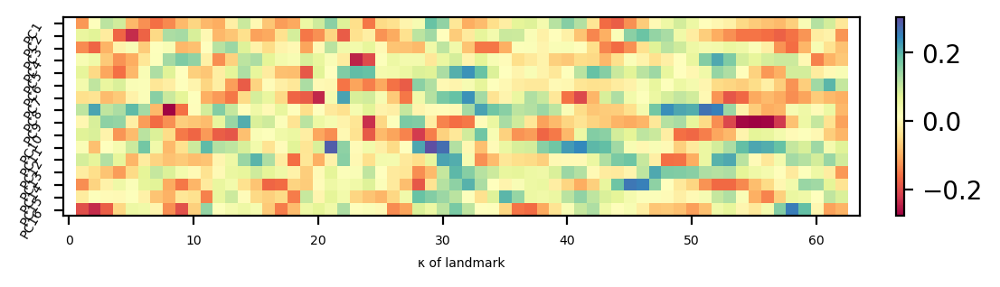

In [17]:
mat = np.concatenate([feature, curvs],axis=1).T
print (mat.shape)
fig = plt.figure(dpi=200)
ax=fig.add_subplot(111)

print (mat.shape)
# plt.imshow(mat[16:,:])
pc_corr = np.corrcoef(mat)
im = ax.imshow(pc_corr[16:,:16].T,cmap="Spectral")
# for i in range(pc_corr[16:,:16].shape[0]):
#   for j in range(pc_corr[16:,:16].shape[1]):
#     plt.text(j,i,round(pc_corr[16:,:16][i][j],3),
#              ha="center", va="center", color="#030303",
#              fontsize=6)


PCs=[]
for i in range(1,17):
    PCs.append("PC{}".format(i))

plt.yticks(range(16),PCs,rotation=60,fontsize=5)
plt.xticks(fontsize=5)
plt.xlabel("κ of landmark",fontsize=5)
#plt.tick_params(top=True, labeltop=True, bottom=False, labelbottom=False)
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="1%", pad=0.2)
plt.colorbar(im, cax=cax)


(80, 104)
(80, 104)


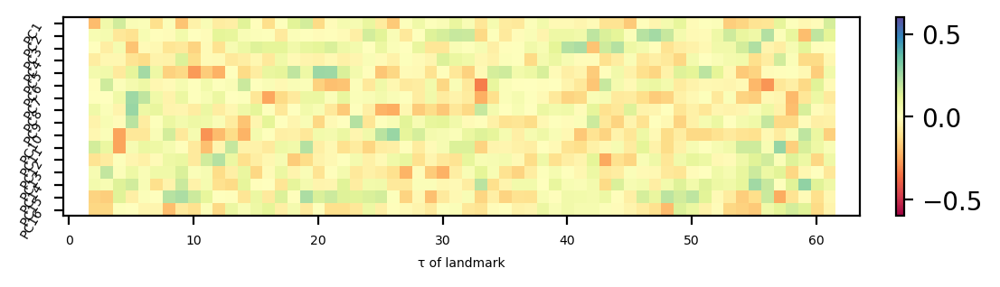

In [18]:
mat = np.concatenate([feature, torss],axis=1).T
print (mat.shape)
fig = plt.figure(dpi=200)
ax=fig.add_subplot(111)

print (mat.shape)
# plt.imshow(mat[16:,:])
pc_corr = np.corrcoef(mat)
im = ax.imshow(pc_corr[16:,:16].T,cmap="Spectral",vmin=-0.6,vmax=0.6)
# for i in range(pc_corr[16:,:16].shape[0]):
#   for j in range(pc_corr[16:,:16].shape[1]):
#     plt.text(j,i,round(pc_corr[16:,:16][i][j],3),
#              ha="center", va="center", color="#030303",
#              fontsize=6)


PCs=[]
for i in range(1,17):
    PCs.append("PC{}".format(i))

plt.yticks(range(16),PCs,rotation=60,fontsize=5)
plt.xticks(fontsize=5)
plt.xlabel("τ of landmark",fontsize=5)
#plt.tick_params(top=True, labeltop=True, bottom=False, labelbottom=False)
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="1%", pad=0.2)
plt.colorbar(im, cax=cax)


(104, 16) (104, 7)
(23, 104)
(23, 104)


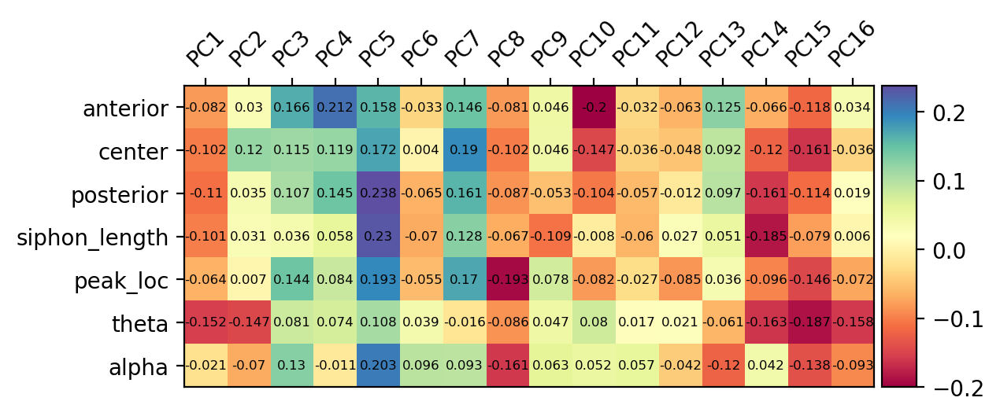

In [19]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

print (l_feature.shape, a.shape)
mat = np.concatenate([l_feature, a],axis=1).T
print (mat.shape)

fig = plt.figure(dpi=200)
ax=fig.add_subplot(111)

print (mat.shape)
# plt.imshow(mat[16:,:])
pc_corr = np.corrcoef(mat)
im = ax.imshow(pc_corr[16:,:16],cmap="Spectral")
for i in range(pc_corr[16:,:16].shape[0]):
  for j in range(pc_corr[16:,:16].shape[1]):
    plt.text(j,i,round(pc_corr[16:,:16][i][j],3),
             ha="center", va="center", color="#030303",
             fontsize=6)


PCs=[]
for i in range(1,17):
    PCs.append("PC{}".format(i))
types_str = df.columns[1:-4]
plt.xticks(range(16),PCs,rotation=45)
plt.yticks(range(len(types_str)),types_str)
plt.tick_params(top=True, labeltop=True, bottom=False, labelbottom=False)
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)
plt.colorbar(im, cax=cax)

(80, 104)
(80, 104)


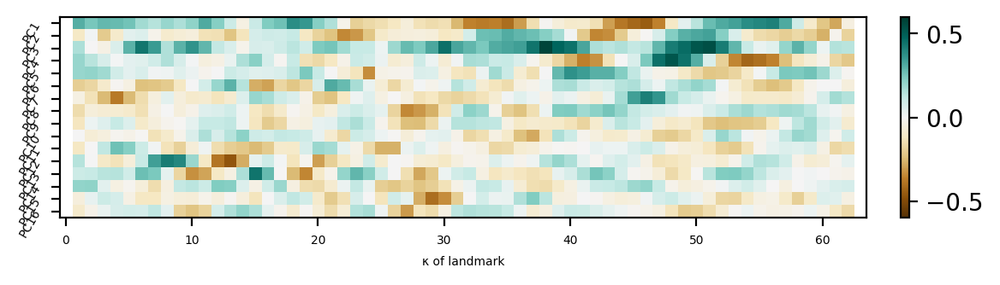

In [44]:
mat = np.concatenate([l_feature, curvs],axis=1).T
print (mat.shape)
fig = plt.figure(dpi=200)
ax=fig.add_subplot(111)

print (mat.shape)
# plt.imshow(mat[16:,:])
pc_corr = np.corrcoef(mat)
im = ax.imshow(pc_corr[16:,:16].T,cmap="BrBG",vmin=-0.6,vmax=0.6)
# for i in range(pc_corr[16:,:16].shape[0]):
#   for j in range(pc_corr[16:,:16].shape[1]):
#     plt.text(j,i,round(pc_corr[16:,:16][i][j],3),
#              ha="center", va="center", color="#030303",
#              fontsize=6)


PCs=[]
for i in range(1,17):
    PCs.append("PC{}".format(i))

plt.yticks(range(16),PCs,rotation=60,fontsize=5)
plt.xticks(fontsize=5)
plt.xlabel("κ of landmark",fontsize=5)
#plt.tick_params(top=True, labeltop=True, bottom=False, labelbottom=False)
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="1%", pad=0.2)
plt.colorbar(im, cax=cax)


(80, 104)
(80, 104)


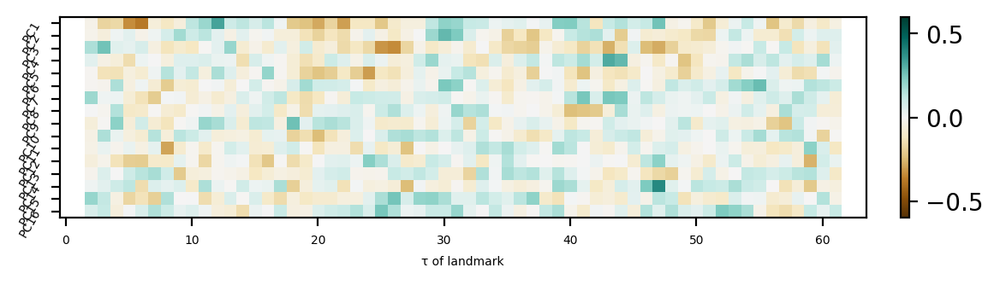

In [45]:
mat = np.concatenate([l_feature, torss],axis=1).T
print (mat.shape)
fig = plt.figure(dpi=200)
ax=fig.add_subplot(111)

print (mat.shape)
# plt.imshow(mat[16:,:])
pc_corr = np.corrcoef(mat)
im = ax.imshow(pc_corr[16:,:16].T,cmap="BrBG",vmin=-0.6,vmax=0.6)
# for i in range(pc_corr[16:,:16].shape[0]):
#   for j in range(pc_corr[16:,:16].shape[1]):
#     plt.text(j,i,round(pc_corr[16:,:16][i][j],3),
#              ha="center", va="center", color="#030303",
#              fontsize=6)


PCs=[]
for i in range(1,17):
    PCs.append("PC{}".format(i))

plt.yticks(range(16),PCs,rotation=60,fontsize=5)
plt.xticks(fontsize=5)
plt.xlabel("τ of landmark",fontsize=5)
#plt.tick_params(top=True, labeltop=True, bottom=False, labelbottom=False)
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="1%", pad=0.2)
plt.colorbar(im, cax=cax)


Text(0.5, 0, 'PC9')

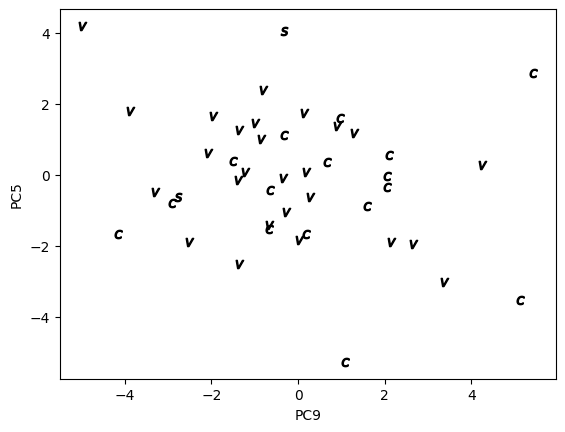

In [ ]:
marker_dict={1:"$S$",2:"$C$",3:"$V$",4:"$U$",0:"o"}

for i in range(len(files)):
    # print (t)
    t = type_labels[i]
    if t != 4:
        plt.scatter(feature[i,6], feature[i,9], color="black",marker=marker_dict[t])

plt.ylabel("PC5")
plt.xlabel("PC9")

[452 651 850]


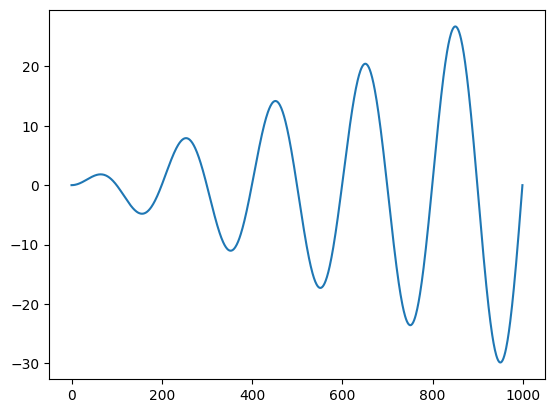

In [ ]:
import numpy as np
from scipy.signal import find_peaks

# 生成示例数据
x = np.linspace(0, 10 * np.pi, 1000)
y = np.sin(x)*x

# 找到峰值并指定突出度阈值
peaks, _ = find_peaks(y, prominence=15)

# 打印峰值的索引位置
print(peaks)

plt.plot(y)

In [156]:
import matplotlib
from myvtk.General import *

c_shapes = mkdir("./CUSV/binormal/", 'c_shape')
other_shapes = mkdir("./CUSV/binormal/", 'other_shape')
p_binormal_dir = mkdir('./scaling/resamp_attr_ascii/vmtk64a/', 'Parallel_binormal')

deg = 70
cosdeg = np.cos(np.radians(deg))
print ("cos deg:", cosdeg)

idx_buff = []
bool_peaks = []

shape_file = "./shape_UCVS.csv"
shape_df = pd.read_csv(shape_file, index_col=False)
shape_df.columns = ['casename', 'type']
for idx in range(len(files)):
    bends = np.zeros(64)
    f_bends = np.zeros(64)
    p_bends = np.zeros(64)
    bool_peak = np.zeros(64)
    filename  =  files[idx].split("\\")[-1][:-12]
    f = open(files[i],"r")
    vtk = f.read()
    vtk = vtk.replace("FIELD FieldData 7", "FIELD FieldData 8")
    f.close()
    f = open(p_binormal_dir+filename+".vtk",'w+')
    f.write(vtk)
    f.write("ParallelTransportBinormal 3 64 double\n")
    temp_pts = pts[idx]
    temp_ptn = PTN[idx]
    temp_tangent = Tangents[idx]
    temp_binormal = fBinormals[idx]
    temp_pnormal =  np.cross(temp_tangent, temp_ptn)
    for i in range(len(temp_pnormal)):
        for j in range(3):
            f.write("{} ".format(temp_binormal[i][j]))
    f.write("\n")
    f.close()
    temp_curv = curvs[idx]
    d_tangent = []

    for nd_idx in range(1, len(temp_pts)):
        # print (nd_idx)
        d_tangent.append(np.dot(temp_tangent[nd_idx-1],temp_tangent[nd_idx]))
    d_tangent=np.array(d_tangent)
    min_dot_idx = np.argmin(d_tangent)
    # print ("min_dot_idx:", min_dot_idx, filename)
    peaks = find_peaks(-d_tangent, distance=5, width=1, height=Height)[0]
    starter = 0
    seg_idx = len(peaks)
    for p in peaks:
        bends[starter:p] = seg_idx
        starter = p
        seg_idx = seg_idx - 1
    scalarAttributes = [['bend', 'float', bends]]

    # makeVtkFile(savePath=savepath+"{}.vtk".format(filename), coords = temp_pts, scalarAttributes=scalarAttributes, fieldAttributes=[])

generating in directory ./CUSV/binormal/c_shape\...
generating in directory ./CUSV/binormal/other_shape\...
generating in directory ./scaling/resamp_attr_ascii/vmtk64a/Parallel_binormal\...
cos deg: 0.3420201433256688


In [120]:
import matplotlib
from myvtk.General import *

c_shapes = mkdir("./CUSV/binormal/", 'c_shape')
other_shapes = mkdir("./CUSV/binormal/", 'other_shape')
savepath = "./CUSV/binormal"
deg = 70
cosdeg = np.cos(np.radians(deg))
print ("cos deg:", cosdeg)

idx_buff = []
bool_peaks = []

shape_file = "./shape_UCVS.csv"
shape_df = pd.read_csv(shape_file, index_col=False)
shape_df.columns = ['casename', 'type']
for idx in range(len(files)):
    bends = np.zeros(64)
    f_bends = np.zeros(64)
    p_bends = np.zeros(64)
    bool_peak = np.zeros(64)
    filename  =  files[idx].split("\\")[-1][:-12]
    # print (filename)
    
    temp_pts = pts[idx]
    temp_ptn = PTN[idx]
    temp_tangent = Tangents[idx]
    temp_binormal = fBinormals[idx]
    temp_pnormal =  np.cross(temp_tangent, temp_ptn)
    temp_curv = curvs[idx]
    d_tangent = []

    for nd_idx in range(1, len(temp_pts)):
        # print (nd_idx)
        d_tangent.append(np.dot(temp_tangent[nd_idx-1],temp_tangent[nd_idx]))
    d_tangent=np.array(d_tangent)
    min_dot_idx = np.argmin(d_tangent)
    # print ("min_dot_idx:", min_dot_idx, filename)
    peaks = find_peaks(-d_tangent, distance=5, width=1, height=Height)[0]
    starter = 0
    seg_idx = len(peaks)
    for p in peaks:
        bends[starter:p] = seg_idx
        starter = p
        seg_idx = seg_idx - 1

    # print (filename, peaks)
    f_bend_idx = 1
    p_bend_idx = 1
    bend_idx = 1
    for p in range(1, len(peaks)-1):
        previous_peak_idx = peaks[p-1]
        peak_idx = peaks[p]
        next_peak_idx = peaks[p+1]
        # bends[previous_peak_idx:peak_idx] = bend_idx*(1/d_tangent[previous_peak_idx:peak_idx])
        # bend_idx = bend_idx + 1

        pnormal_theta = np.dot(temp_pnormal[peak_idx], temp_pnormal[previous_peak_idx])
        pnormal_phi = np.dot(temp_pnormal[peak_idx], temp_pnormal[next_peak_idx])
        binormal_theta = np.dot(temp_binormal[peak_idx], temp_binormal[previous_peak_idx])
        binormal_phi = np.dot(temp_binormal[peak_idx], temp_binormal[next_peak_idx])
        # print ("parallel transport binormal:", round(pnormal_theta,3))
        # print ("frenet binormal:", round(binormal_theta,3))

        if ((abs(binormal_theta) < cosdeg) or (abs(binormal_phi) < cosdeg)) and previous_peak_idx<=min_dot_idx and peak_idx > min_dot_idx:
            print (filename, "frenet")
            f_bends[previous_peak_idx:] = f_bend_idx
            f_bend_idx = f_bend_idx + 1
        if (abs(pnormal_theta) < cosdeg or abs(pnormal_phi) < cosdeg) and previous_peak_idx<=min_dot_idx and peak_idx > min_dot_idx:
            print (filename, "parallel")
            p_bends[previous_peak_idx:] = p_bend_idx
            p_bend_idx = p_bend_idx + 1
        if abs(peak_idx-min_dot_idx)== 0 and (abs(binormal_theta) < cosdeg or abs(pnormal_theta) < cosdeg or abs(binormal_phi) < cosdeg or abs(pnormal_phi) < cosdeg ) :
            savepath = c_shapes
        else:
            savepath = other_shapes

            
    scalarAttributes = [['bend', 'float', bends],
                        ['frenet_bend', 'float', f_bends],
                        ['parallel_bend', 'float', p_bends]]

    makeVtkFile(savePath=savepath+"{}.vtk".format(filename), coords = temp_pts, scalarAttributes=scalarAttributes, fieldAttributes=[])
        

generating in directory ./CUSV/binormal/c_shape\...
generating in directory ./CUSV/binormal/other_shape\...
cos deg: 0.3420201433256688
BG0014_Left frenet
BG0019_Left frenet
BG0019_Left parallel
BG0019_Right frenet
BG0021_Left parallel
BG04_Left frenet
BG04_Right frenet
BG09_Right frenet
BG10_Right parallel
BG11_Left frenet
BG11_Left parallel
BG11_Right parallel
BG12_Left frenet
BG12_Left parallel
BG12_Right frenet
BG13_Left frenet
BG13_Right frenet
BG15_Left parallel
BG17_Left parallel
BG17_Right frenet
BG18_Left parallel
BG18_Right frenet
BH0002_Left frenet
BH0002_Left parallel
BH0002_Right parallel
BH0003_Left frenet
BH0005_Left parallel
BH0005_Right frenet
BH0008_Left frenet
BH0008_Left parallel
BH0008_Right frenet
BH0009_Left frenet
BH0009_Left parallel
BH0009_Right frenet
BH0009_Right parallel
BH0010_Left frenet
BH0011_Left frenet
BH0011_Left parallel
BH0011_Right frenet
BH0012_Right frenet
BH0013_Right frenet
BH0015_Right frenet
BH0016_Left frenet
BH0016_Left parallel
BH0016_Rig

IndexError: index 84 is out of bounds for axis 0 with size 84

In [80]:
bool_peaks = np.array(bool_peaks)
print (bool_peaks.shape)

pca = PCA(n_components=2)
result = pca.fit_transform(bool_peaks)
fig = plt.figure(figsize=(10,10))


from sklearn.cluster import KMeans
from scipy import optimize
from math import sqrt


#Initialize the class object
kmeans = KMeans(n_clusters= 4)
 
#predict the labels of clusters.
label = kmeans.fit_predict(result)
 
#Getting unique labels
u_labels = np.unique(label)


#plotting the results:
plt.figure(figsize=(7,6))
# for idx in range(len(files)):
#     bool_peak = np.zeros(64)
#     filename  =  files[idx].split("\\")[-1][:-12]
#     if idx in idx_buff:
#         plt.scatter(result[idx, 0] , result[idx, 1] , 
#                 label = i, 
#                 color='red', 
#                 s=70)


for i in u_labels:
    plt.scatter(result[label == i , 0] , result[label == i , 1] , 
                label = i, 
                color='dimgray', 
                s=70,
                marker="${}$".format(i))
plt.scatter(kmeans.cluster_centers_[:,0],kmeans.cluster_centers_[:,1],color='red',marker='+',label='centroid')
plt.grid(color = 'silver', linestyle = '--', linewidth = 0.5,alpha=0.3)
# plt.legend()
# plt.savefig('cluster.png')
plt.show()

(0,)


ValueError: Expected 2D array, got 1D array instead:
array=[].
Reshape your data either using array.reshape(-1, 1) if your data has a single feature or array.reshape(1, -1) if it contains a single sample.

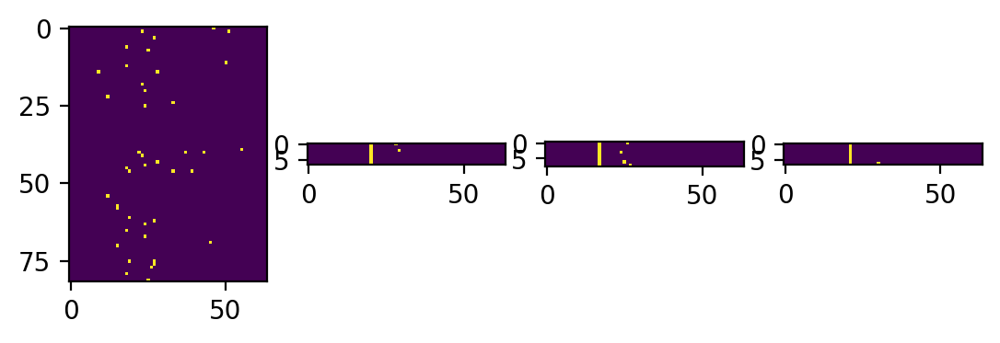

In [ ]:
fig = plt.figure(dpi=200)
ax1 = fig.add_subplot(141)
ax2 = fig.add_subplot(142)
ax3 = fig.add_subplot(143)
ax4 = fig.add_subplot(144)
ax1.imshow(bool_peaks[label==0])
ax2.imshow(bool_peaks[label==1])
ax3.imshow(bool_peaks[label==2])
ax4.imshow(bool_peaks[label==3])
    

需要开发一个评分体系来评价一个形状的likelihood

In [ ]:
from collections import Counter
label_sorted = list(Counter(label))


labeldict = {
    label_sorted[0]:"mass",
    label_sorted[1]:"type1",
    label_sorted[2]:"type2",
    label_sorted[3]:"type3"
}

print (labeldict)

{0: 'mass', 2: 'type1', 3: 'type2', 1: 'type3'}


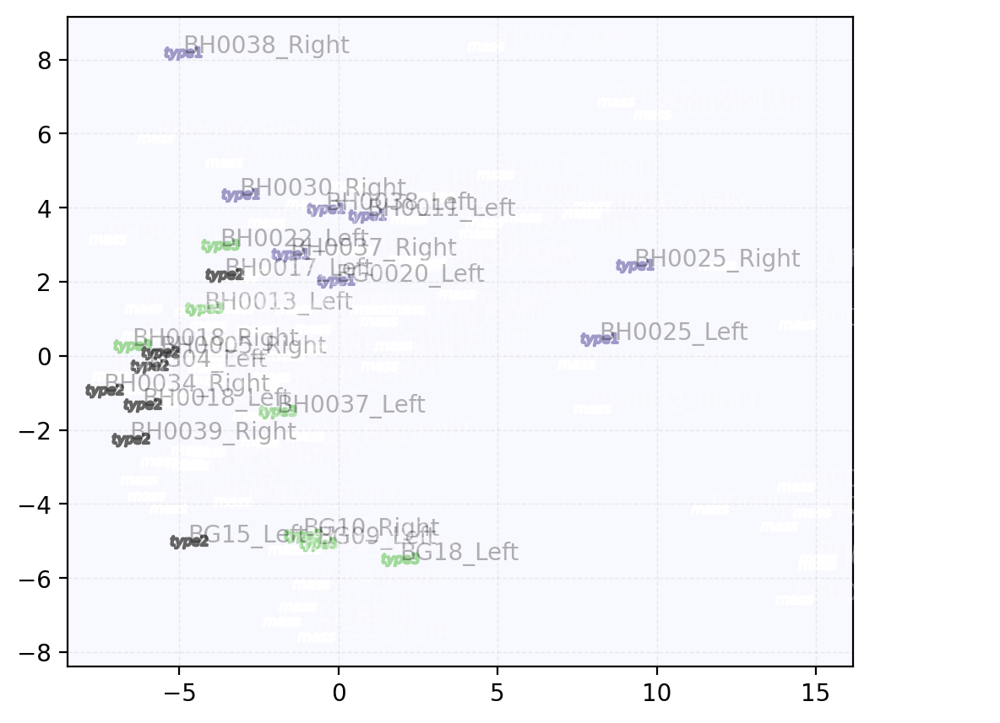

In [ ]:


#plotting the results:
cmap=matplotlib.cm.get_cmap("tab20c")
fig = plt.figure(dpi=200,figsize=(6,5))
ax = fig.add_subplot(111)
pc_x = 1
pc_y = 2
for i in u_labels:
    if labeldict[i] == "mass":
        color="white"
        # color=cmap((i+2)/(len(u_labels)+2)), 
    else:
        color=cmap((i+2)/(len(u_labels)+2)), 

    ax.scatter(feature[label == i , pc_x] , feature[label == i , pc_y] , 
                label = i, 
                color=color, 
                s=250,
                marker="${}$".format(labeldict[i]))
for i in range(len(files)):
    # print (files[i])
    # if "BH0021" in files[i]:
    if label[i] == 0:
        color="white"
    else:
        color ="black"

    ax.text(feature[i , pc_x] , feature[i, pc_y] , 
               s = files[i].split("\\")[-1][:-12], 
               color=color,
               alpha=0.3)
# plt.scatter(kmeans.cluster_centers_[:,0],kmeans.cluster_centers_[:,1],color='dimgray',marker='+',label='centroid')
ax.grid(color = 'silver', linestyle = '--', linewidth = 0.5,alpha=0.3)
ax.set_facecolor("ghostwhite")
# plt.legend()
# plt.savefig('cluster.png')
plt.show()


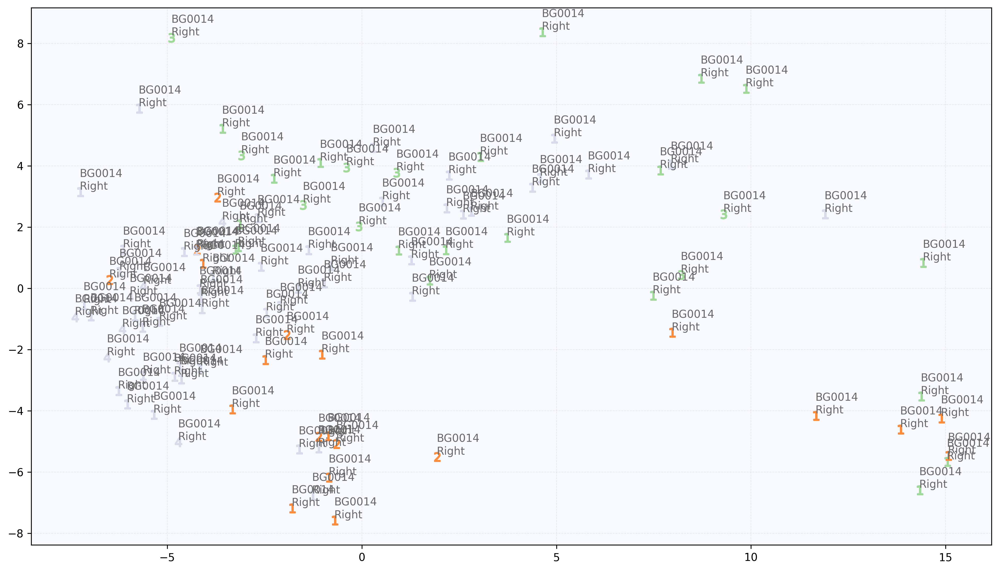

In [ ]:
#plotting the results:
cmap=matplotlib.cm.get_cmap("tab20c")
fig = plt.figure(figsize=(16,9), dpi=300)
ax = fig.add_subplot(111)
pc_x = 1
pc_y = 2

clusters = []
c_centroids = []
for i in u_labels:
    ax.scatter(feature[label == i , pc_x] , feature[label == i , pc_y] , 
                label = i, 
                color=cmap((i+0)/(len(u_labels)+0)), 
                s=70,
                marker="${}$".format(i+1))
    cluster = []
    most_typical_distance = 10000
    most_typical_idx = -1
    for j in range(len(feature)):
        if label[j] == i:
            cluster.append(feature[j])
    cluster = np.array(cluster)
    cluster_centroid = np.mean(cluster,axis=0)
    # ax.scatter(cluster_centroid[pc_x], cluster_centroid[pc_y], 
    #            marker="+", 
    #            color = cmap((i+0)/(len(u_labels)+0)),
    #            s = 90)
    clusters.append(cluster)
    c_centroids.append(cluster_centroid)

for j in range(len(feature)):
    ax.text(feature[j, pc_x] , feature[j, pc_y],
            files[i].split("\\")[-1][:-12].split("_")[0] + "\n" + files[i].split("\\")[-1][:-12].split("_")[1],
            color='dimgray',
            va="bottom",
            rotation = 0)
    if label[j] == 0:
        distance_to_1 = np.linalg.norm(feature[j] - c_centroids[1])
        distance_to_2 = np.linalg.norm(feature[j] - c_centroids[2])
        distance_to_3 = np.linalg.norm(feature[j] - c_centroids[3])
        distance_list = [distance_to_1, distance_to_2, distance_to_3]
        min_distance = distance_list.index(min(distance_list))
        # print (min_distance)
        ax.scatter(feature[j, pc_x] , feature[j, pc_y] , 
                color=cmap((min_distance +1)/(len(u_labels)+0)), 
                s=70,
                marker="${}$".format(1))



    
ax.grid(color = 'silver', linestyle = '--', linewidth = 0.5,alpha=0.3)
ax.set_facecolor("ghostwhite")
# plt.legend()
# plt.savefig('cluster.png')
plt.show()
